# Section 1: Introduction + Data analysis and visualization

## Introduction

This is bike sharing project, we have access to 2018 data from New York Citi Bike to do analysis, prediction and exploratory to see how can we make emission-free transport systems more efficient and attractive.

## Data Anlysis

In [ ]:
import pandas as pd
import datetime

In [ ]:
df = pd.read_csv('Trips_2018.csv')

In [ ]:
df['starttime'] = pd.to_datetime(df['starttime'], infer_datetime_format=True)
df['stoptime'] = pd.to_datetime(df['stoptime'], infer_datetime_format=True)

### Checking missing values

In [ ]:
df.isnull().sum()

Unnamed: 0                    0
tripduration                  0
starttime                     0
stoptime                      0
start_station_id           2497
start_station_latitude        0
start_station_longitude       0
end_station_id             2497
end_station_latitude          0
end_station_longitude         0
bikeid                        0
usertype                      0
birth_year                    0
gender                        0
dtype: int64

There are 2497 data missing start and end station id, we just delete them since we have a huge dataset.

In [ ]:
df = df.dropna(axis = 0, how ='any')

###  Data Distribution

#### - usertype

In [ ]:
df.groupby('usertype').size()

usertype
Customer       1932472
Subscriber    15613370
dtype: int64

Most users are subscribers(annual member), aroud 89%. Customers are only occupy 11%.

#### tripduarion

In [ ]:
df['tripduration'].describe()

count    1.754584e+07
mean     9.884746e+02
std      1.889591e+04
min      6.100000e+01
25%      3.580000e+02
50%      6.050000e+02
75%      1.060000e+03
max      1.951005e+07
Name: tripduration, dtype: float64

The max trip duration is extremely higher than the mean duration, we keep the top 95.5% data to see the distribution.

In [ ]:
df = df[df['tripduration']<df['tripduration'].quantile(q=0.995)]

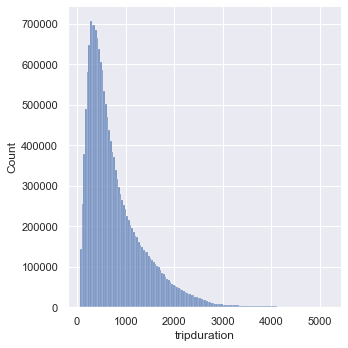

In [ ]:
plottripsduation(df['tripduration'])

In [ ]:
df = pd.get_dummies(df, columns=['usertype'],drop_first=True)

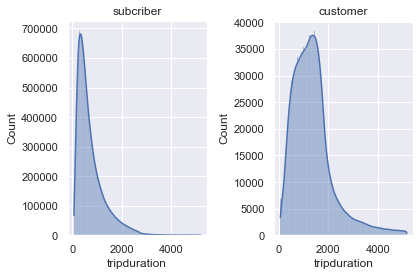

In [ ]:
plottripduration(df['tripduration'])

People generally prefer to rent bikes for short trips, but customers' trip durations are relatively higher than subcribers(lower 2000 seconds).

#### - age

In [ ]:
df['age'] = 2018 - df['birth_year']
df['age'].value_counts().iloc[:15]

49    1619946
30     705671
28     695268
29     690132
27     656608
31     639725
26     620180
32     612364
33     606043
25     561039
34     555007
35     510208
36     493556
37     454968
24     426668
Name: age, dtype: int64

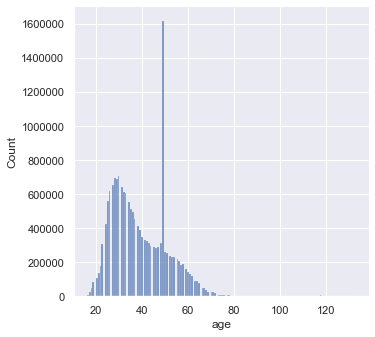

In [ ]:
agesdistribution(df['age'])

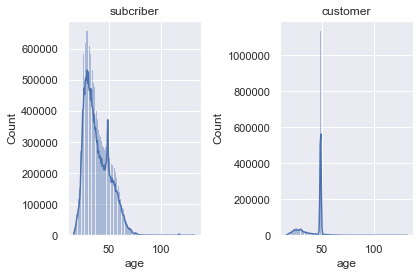

In [ ]:
agedistribution(df['age'])

Normally, people between 25 and 35 years old are main ridership force. However 49 years old ridership is extremely high, they are mostly customers.

#### gender

In [ ]:
df['gender'].value_counts()

1    11942357
2     4075574
0     1440170
Name: gender, dtype: int64

In [ ]:
df[df['usertype_Subscriber'] == 1]['gender'].value_counts()

1    11481558
2     3805900
0      303690
Name: gender, dtype: int64

In [ ]:
df[df['usertype_Subscriber'] == 0]['gender'].value_counts()

0    1136480
1     460799
2     269674
Name: gender, dtype: int64

Unknown age information of customers are high, from known information, we know male prefer to rent bikes than female.

### Data Visualization Anlysis

#### based on month

In [ ]:
df['start_month'] = df['starttime'].dt.month
sub = df[df['usertype_Subscriber']==1].groupby('start_month').size()
cus = df[df['usertype_Subscriber']==0].groupby('start_month').size()

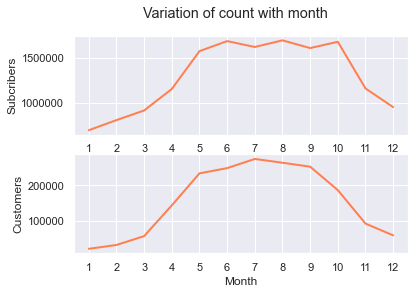

In [ ]:
month(cus,sub)

Both subcribers and customers prefer to rent bikes in Summer, then Autumn and Spring, last in Winter.

#### based on weekly

In [ ]:
df['weekday'] = df['starttime'].dt.weekday

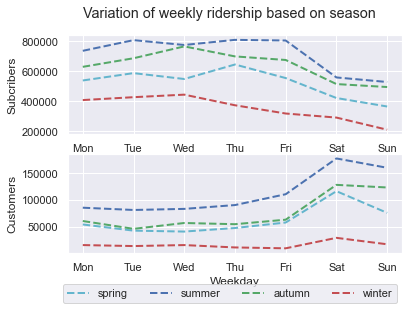

In [ ]:
weekly(sub_spring,sub_summer,sub_autumn,sub_winter,cus_spring,cus_summer,cus_autumn,cus_winter)

Subcribers like to rent bikes on weekdays while customers like to rent on weekends. We can also see that ridership decreases from summer to autumn to spring to winter.

#### based on day

In [ ]:
df['hour'] = df['starttime'].dt.hour

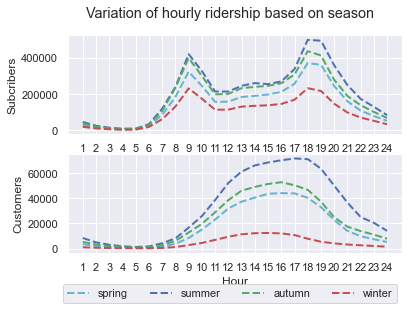

In [ ]:
day(sub_spring,sub_summer,sub_autumn,sub_winter,cus_spring,cus_summer,cus_autumn,cus_winter)

There are two obvious peaks time for subcribers, they are main commuting time and customers like to rent bikes from 10am to 8pm. Combined with all information we guess subcribers are workers, students and other people like that. Customers rent bikes for temporary demand. Seasons do not effect the demand distribution within one day.

#### based on station

In [ ]:
data_start=df.loc[df['start_station_id'].isin(list(df['start_station_id'].value_counts().iloc[:30].index))]

In [ ]:
map_start = folium.Map(location=[40.751873, -73.977706], zoom_start = 14)

data_newstart = data_start[data_start['start_month']==8]
heat_start = [[row['start_station_latitude'],row['start_station_longitude']] for index, row in data_newstart.iterrows()]
HeatMap(heat_start).add_to(map_start)
map_start

By top 30 stations positions, we know people like to rent bikes at terminals, parks, universities and other large public areas.

#### based on dayly pickups

In [ ]:
df['date'] = df['starttime'].dt.date
daily_pickups = df.groupby('date').count()

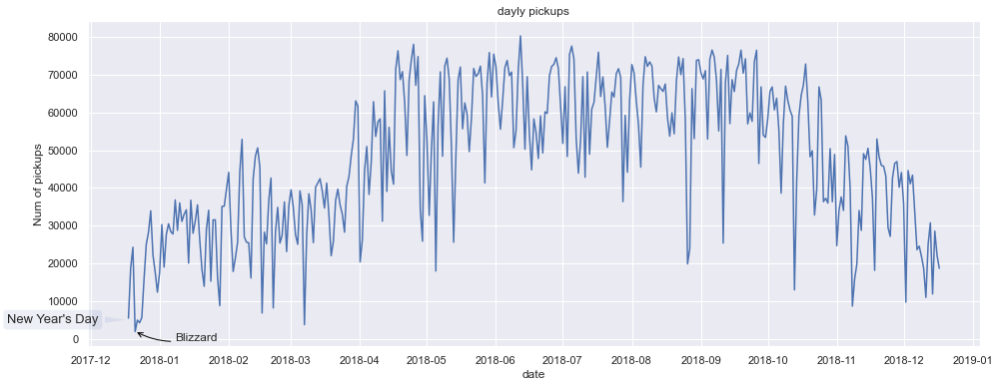

In [ ]:
pickups(daily_pickups['bikeid'])

Here we can see that certain events/phenomena play a major role in the bike demant (e.g. New York's Day, Blizzards)

#### based on velocity

In [ ]:
df['distance']=haversine_vectorized(df)
df['Avg velocity']=df.distance *3600 / df.tripduration #Velocity is computed in mph

In [ ]:
velsub = df[(df['usertype_Subscriber'] == 1) & (df['Avg velocity'] < 15)]['Avg velocity']
velcus = df[(df['usertype_Subscriber'] == 0) & (df['Avg velocity'] < 15)]['Avg velocity']

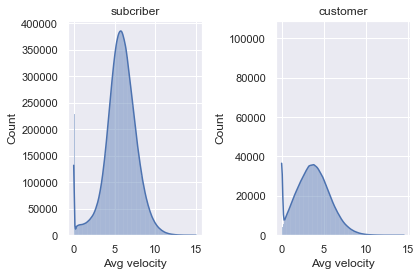

In [ ]:
plotvelocityusertype()

The average velocity of subscribers, which normally take he bike more often, is higher.

In [ ]:
df_vel=df[df['Avg velocity'] < 20]

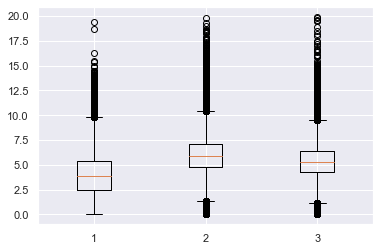

In [ ]:
plotvelocitygender()

Number 2 corresponds to men and number 3 to women. It is observed that the average velocity of men is slightly higher than women, and noticeably higher than those which chose anther option for gender.

# Section 2: Prediction Challenge

In [ ]:
data = PredictiveDataClean(df)

In [ ]:
data.head()

,datetime,count,hour,month,weekday,day,weekly
0,2018-01-01 00:00:00,119,0,1,0,1,1
1,2018-01-01 01:00:00,167,1,1,0,1,1
2,2018-01-01 02:00:00,98,2,1,0,1,1
3,2018-01-01 03:00:00,72,3,1,0,1,1
4,2018-01-01 04:00:00,34,4,1,0,1,1


The data is taken from the descriptive notebook, in which data was analyzed and filtered.The function of DataCleaning is found in the Appendix. In this process, the bike rides are grouped by hour, having a total count of bike pick ups by hour during the 1 year period of 2018. The other variables kept are the hour of the day of the pickup, the month, the day of the week and the information whether it is weekend or not.

## Part 1

The train set for part 1 is defined as the months of July and August, and the test set is the 1st week of September. The hours are considered categorial variables, and are transformed into dummies. No standardization/normalization is performed as there are no continuous variables, just boolean values. The purpose of standardization is to bring features with disparate ranges into a standard range. When the data is not standardized, features with large numerical values will tend to have a larger influence (weight) than those that are smaller numerically

In [ ]:
x_train1, x_test1, y_train1, y_test1=Predictive_Part1_data(data)

In [ ]:
x_train1.head()

,weekly,hour_1,hour_2,hour_3,hour_4,hour_5,hour_6,hour_7,hour_8,hour_9,...,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
4327,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4328,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4329,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4330,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4331,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


The selection of the predictor is based on the R-square value and the mean and root mean squared errors (MSE & RMSE). The best regressor found is the Random Forest Regressor for this problem. The score of other regressors analyzed can be found at the end of section 1.

Random Forest Regressor
R-squared for Train: 0.88
R-squared for Test: 0.88
MSE =42684220888856.66
RMSE = 6533316.224464928


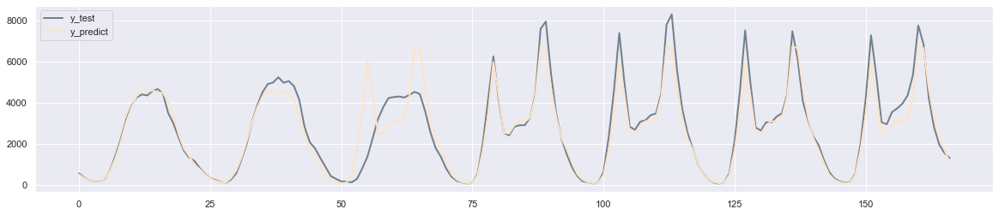

In [ ]:
Predictive_Part1(x_train1, x_test1, y_train1, y_test1)

The results show an R^2 of 88% both in Train and Test sets. This same value implies a perfect balance between over and underfitting. The minimum desired value for this exercise was of 70%, exceeding this value by 18%. The graph above shows the good fitting in most of the days, except in the 3rd one. This mismatch in the 3rd day (Monday) can be due to abnormal values in previous Mondays in the train set. However, the fitting in the rest of days is excellent.

After several tries of parameter tuning of this regressor, it has not been possible to reduce the MSE/RMSE nor to increase the R-squared. Hence, the original settings are kept.

The prediction shows a clear pattern during weekdays (from 50h to 175h in x axis), in which people do bike trips for commuting, with a valley of use during nights and worktime.

In [ ]:
Other_Part1_Predictions(x_train1, x_test1, y_train1, y_test1)

Ridge
R-squared for Train: 0.77
R-squared for Test: 0.78
MSE =76396735262602.11
RMSE = 8740522.596653024
Lasso
R-squared for Train: 0.77
R-squared for Test: 0.78
MSE =75417119497981.2
RMSE = 8684303.051942695
Decision Tree Classifier
R-squared for Train: 0.05
R-squared for Test: 0.01
MSE =235804860434836.4
RMSE = 15355938.93042156
Gradient Boost Regressor
R-squared for Train: 0.82
R-squared for Test: 0.81
MSE =235804860434836.4
RMSE = 15355938.93042156


The rest of predictions offer worse results than the selected one.

## Part 2

The train set for part 2 is defined as the months from January to October, and the test set are November and December. Again, the categorial values are transformed into dummies.

In [ ]:
x_train2, x_test2, y_train2, y_test2=Predictive_Part2_data(data)
x_train2.head()

,weekly,hour_1,hour_2,hour_3,hour_4,hour_5,hour_6,hour_7,hour_8,hour_9,...,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


R-squared for Train: 0.71
R-squared for Test: 0.50
MSE =30234721270072.973
RMSE = 5498610.8491211645


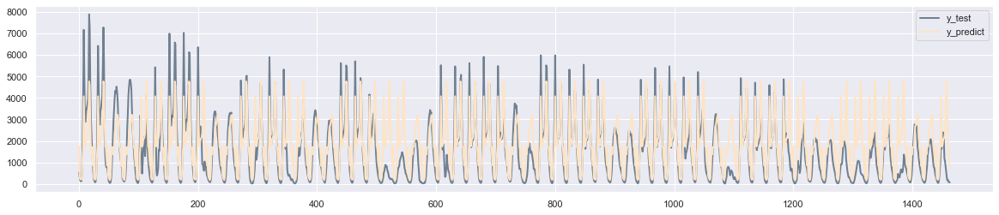

In [ ]:
Predictive_Part2(x_train2, x_test2, y_train2, y_test2)

The regressor chosen for 2nd Part is the Gradient Boosting Regressor, which present a R^2 of 50% in the test set (which is over the objective of R^2 = 30%). There exists overfitting, as the R^2 in the Train set is 71%. This is due to the difference in nature between november and december with the rest of months (different weather, different people habits and holidays at the end of year). This issue will be addressed in the Exploratory Analysis with the introduction of weather data. However, other potential data sources may be required to reach an adequate level of generalizability.
Besides,certain parameter tuning must be performed to improve the results.

R-squared for Train: 0.80
R-squared for Test: 0.58
MSE =26786316000929.504
RMSE = 5175549.825953713


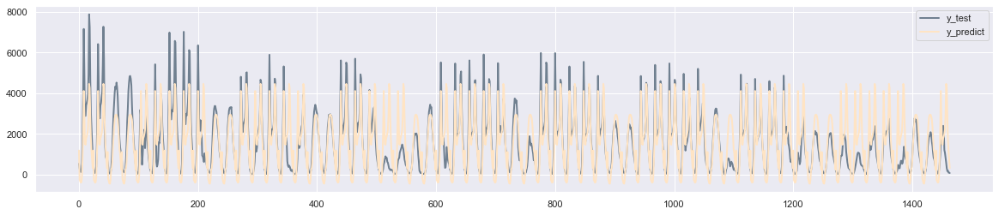

In [ ]:
Predictive_Part2_tuning(x_train2, x_test2, y_train2, y_test2)

The parameter tuning has increased the R^2 of both train and test by a 8-9%, reducing the MSE by a 10%. However, there is still overfitting.

# Section 3: Exploratory Component

## Data Extension

## Weather  

Data has been obtained from this source - https://www.ncdc.noaa.gov/

The original dataset is extended via 2 new relevant datasets. The first one is the weather in the city of NY (temperatures and rain/snow), while the second one is the sunset and sunrise hours. This data addition has the purpose of overcoming certain limitation in the bike rides forecast from previous analysis.

In [ ]:
data_ext = NewDataClean(data_weather,data_light,data)

In [ ]:
data_ext.head()

,datetime,count,hour,month,weekday,day,weekly,avg,precipitation,snow,sunrise,sunset,light
0,2018-01-01 00:00:00,119,0,1,0,1,1,13.0,0.0,0.0,08:20:00,17:39:00,0
1,2018-01-01 01:00:00,167,1,1,0,1,1,13.0,0.0,0.0,08:20:00,17:39:00,0
2,2018-01-01 02:00:00,98,2,1,0,1,1,13.0,0.0,0.0,08:20:00,17:39:00,0
3,2018-01-01 03:00:00,72,3,1,0,1,1,13.0,0.0,0.0,08:20:00,17:39:00,0
4,2018-01-01 04:00:00,34,4,1,0,1,1,13.0,0.0,0.0,08:20:00,17:39:00,0


## Reasearch Questions

Here we have answered 2 main research questions:
- how does new data influence our predictions?
- is it possible to create clusters of stations based on interval pickups?
- how does light incluence the pickups demand? (part of Appendix 6.3.1)

###  Prediction of 1 week given 2 months with weather and light data addition

Our first research question is whether new data for the last 2 months (weather and light) will improve our predictions for the net week

The extension of new information consist of 4 new variables: 3 continuous (avg temperature, rain precipitation, snow precipitation) and a boolean (natural light Yes/No). It is necessary to standardize the continuous variables.

In [ ]:
x_train3, x_test3, y_train3, y_test3=Predictive_ext_Part1_data(data_ext)

Random Forest Regressor
R-squared for Train: 0.98
R-squared for Test: 0.86
MSE =46563208297856.305
RMSE = 6823723.931831966


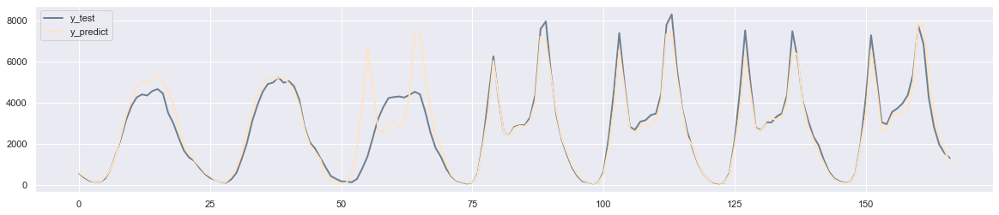

In [ ]:
Predictive_ext_Part1(x_train3, x_test3, y_train3, y_test3)

The results of the test prediction do not improve respect to the original set. However, the Train Set R^2 improves, elading to overfitting. This is fixed via parameter tuning below.

Random Forest Regressor
R-squared for Train: 0.91
R-squared for Test: 0.87
MSE =42966138637477.02
RMSE = 6554856.111119223


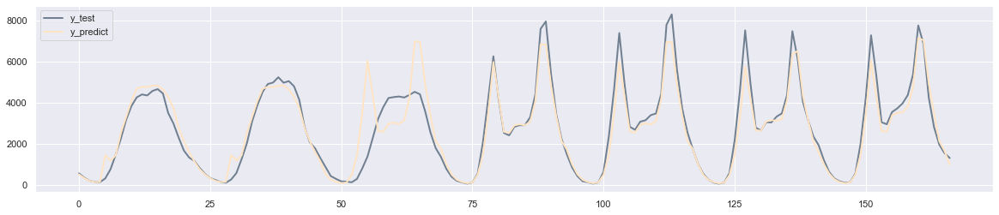

In [ ]:
Predictive_ext_Part1_tuning(x_train3, x_test3, y_train3, y_test3)

It is seen that the weather/light information does not improve the forecast of bike rides in near times. This may be due to weather/light similarity between train and test sets. Anyhow, the forecast results are satisfactory due to its high R^2 metric.

### Prediction of 2 months given 10 months with weather data addition

Furthermore, we want to investigate whether 10 months of data will improve our model, giving better predictions for the next 2 months

In [ ]:
x_train4, x_test4, y_train4, y_test4=Predictive_ext_Part2_data(data_ext)

R-squared for Train: 0.85
R-squared for Test: 0.63
MSE =27641242483699.168
RMSE = 5257493.935678782


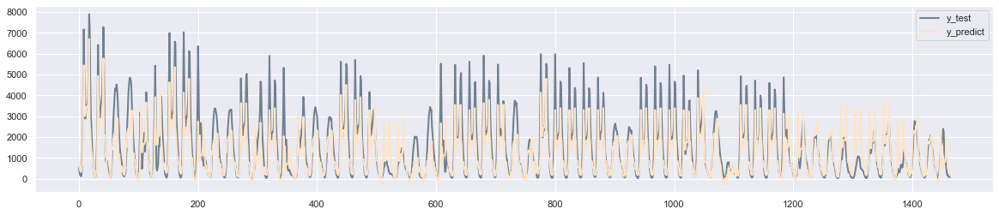

In [ ]:
Predictive_ext_Part2(x_train4, x_test4, y_train4, y_test4)

The bike rides prediction improves noticeably, reaching an R^2 of 64% without parameter tuning vs a 50% in the Predictive Part. There is still certain overfitting, as the results in the Train Set are better than in the Test Set. This fact help us to understand that the addition of relevant data improves the generalizability of data to predict data points. Hence, other relevant datasets will improve the prediction even more.

R-squared for Train: 0.89
R-squared for Test: 0.68
MSE =20297410993755.707
RMSE = 4505264.808394253


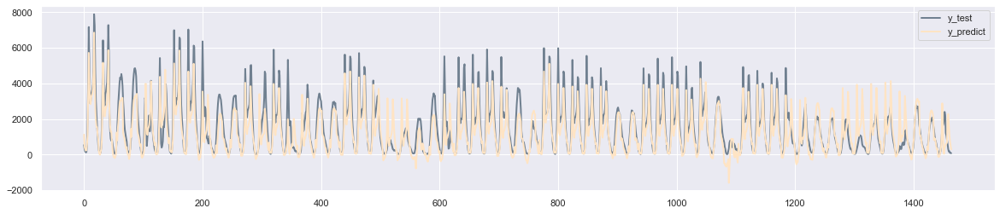

In [ ]:
Predictive_ext_Part2_tuning(x_train4, x_test4, y_train4, y_test4)

With parameter tuning, the R^2 values are increased, and the MSE/RMSE decreased, refining the results

### PCA & Stations Clustering

Our next research question is whether we can cluster stations based on 24h intervals, each having the average pickup in that period.

We have a new dataframe(Appendix(5.3.2.2.)), containing 24 hour intervals as columns, and stations grouped by day as rows, each interval representing the average pickups within that interval

We can see ´df_stations´ below. First we'll standardize the data, then we'll do PCA on it

In [ ]:
df_stations.head()

,00:00-00:59,01:00-01:59,02:00-02:59,03:00-03:59,04:00-04:59,05:00-05:59,06:00-06:59,07:00-07:59,08:00-08:59,09:00-09:59,...,14:00--14:59,15:00--15:59,16:00--16:59,17:00--17:59,18:00--18:59,19:00--19:59,20:00--20:59,21:00--21:59,22:00--22:59,23:00--23:59
start_station_id,,,,,,,,,,,,,,,,,,,,,
72.0,0.912329,0.657534,0.449315,0.230137,0.315068,0.747945,1.397260,4.693151,9.254795,8.093151,...,5.849315,6.213699,7.531507,9.441096,9.558904,7.054795,4.189041,2.495890,2.172603,1.539726
79.0,0.627397,0.323288,0.158904,0.082192,0.049315,0.331507,0.745205,1.328767,4.202740,3.808219,...,4.619178,4.641096,5.676712,7.915068,9.676712,6.139726,3.389041,2.282192,1.375342,1.038356
82.0,0.172603,0.109589,0.071233,0.030137,0.024658,0.101370,1.120548,1.060274,1.487671,2.252055,...,1.736986,1.813699,1.964384,2.361644,2.386301,1.917808,1.342466,0.849315,0.490411,0.315068
83.0,0.419178,0.246575,0.101370,0.065753,0.035616,0.049315,0.758904,0.928767,1.049315,1.013699,...,2.153425,2.265753,2.454795,3.189041,3.879452,3.219178,2.320548,1.923288,1.575342,1.172603
119.0,0.021918,0.041096,0.027397,0.013699,0.041096,0.090411,0.465753,0.460274,0.854795,0.684932,...,0.613699,0.504110,0.605479,0.665753,0.531507,0.528767,0.326027,0.183562,0.142466,0.071233


#### PCA

First, we will standardize the data, and then we shall plot the explained cdf variance for the PCA, to choose the number of principal components, on which we will work on.

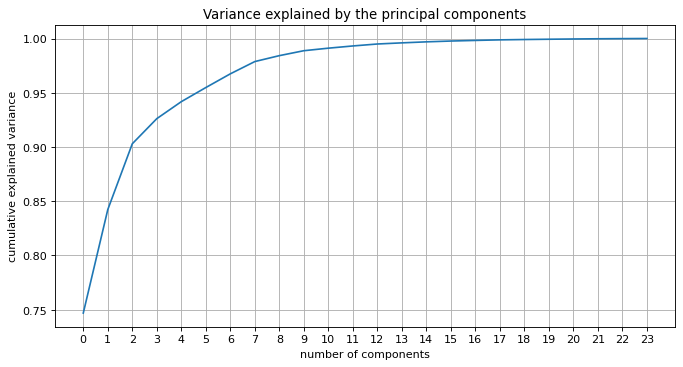

Explained variance ration 
 [0.74686956 0.84225959 0.90294446 0.92610629 0.94177054 0.9547748
 0.96742314 0.97874233 0.98419239 0.98874798 0.99108444 0.9931313
 0.99493461 0.99598283 0.99691833 0.99766954 0.99823135 0.99874877
 0.99906336 0.99932406 0.99956252 0.99974737 0.9998818  1.        ]


In [ ]:
X_std_stations = StandardScaler().fit_transform(df_stations)
PCA().fit(X_std_stations)
plot_pca_variance(pca_stations)

3 Principal Components explain 90% of the variance, which is fine for our model. Furthermore, our intention is to discover cluster of stations on the first 2 principal components, using the KMeans Algorithm.

In [ ]:
pca_stations = PCA(n_components=3)
df_stations_reduced = pca_stations.fit_transform(X_std_stations)

#### KMeans Clustering
Resource: https://365datascience.com/tutorials/python-tutorials/pca-k-means/

In [ ]:
df_stations_pca_kmeans.head()

,start_station_id,00:00-00:59,01:00-01:59,02:00-02:59,03:00-03:59,04:00-04:59,05:00-05:59,06:00-06:59,07:00-07:59,08:00-08:59,...,18:00--18:59,19:00--19:59,20:00--20:59,21:00--21:59,22:00--22:59,23:00--23:59,Component 1,Component 2,Component 3,PCA Cluster
0,72.0,0.912329,0.657534,0.449315,0.230137,0.315068,0.747945,1.397260,4.693151,9.254795,...,9.558904,7.054795,4.189041,2.495890,2.172603,1.539726,3.904104,0.416550,-0.132512,2
1,79.0,0.627397,0.323288,0.158904,0.082192,0.049315,0.331507,0.745205,1.328767,4.202740,...,9.676712,6.139726,3.389041,2.282192,1.375342,1.038356,0.858575,-0.782811,-0.657274,2
2,82.0,0.172603,0.109589,0.071233,0.030137,0.024658,0.101370,1.120548,1.060274,1.487671,...,2.386301,1.917808,1.342466,0.849315,0.490411,0.315068,-2.455164,-0.187521,0.056385,0
3,83.0,0.419178,0.246575,0.101370,0.065753,0.035616,0.049315,0.758904,0.928767,1.049315,...,3.879452,3.219178,2.320548,1.923288,1.575342,1.172603,-1.465272,0.353262,-0.796547,0
4,119.0,0.021918,0.041096,0.027397,0.013699,0.041096,0.090411,0.465753,0.460274,0.854795,...,0.531507,0.528767,0.326027,0.183562,0.142466,0.071233,-3.837320,0.103990,0.150235,0


/zhome/48/e/160183/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


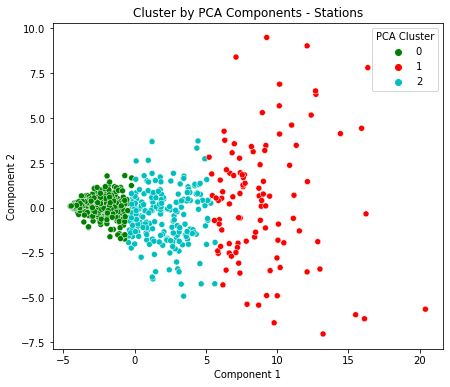

In [ ]:
plot_clusters_by_components(df_stations_pca_kmeans, 'Component 1', 'Component 2')

/zhome/48/e/160183/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


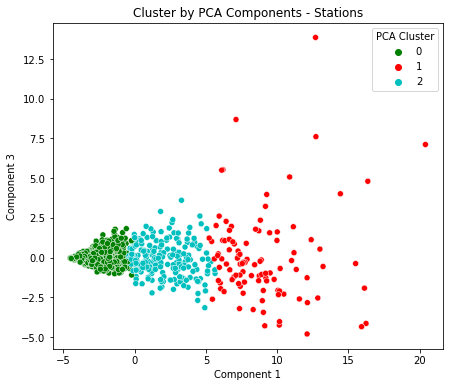

In [ ]:
plot_clusters_by_components(df_stations_pca_kmeans, 'Component 1', 'Component 3')

/zhome/48/e/160183/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


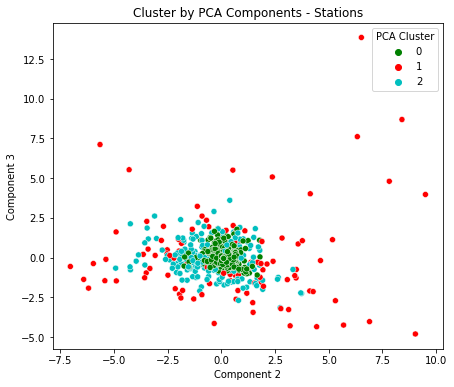

In [ ]:
plot_clusters_by_components(df_stations_pca_kmeans, 'Component 2', 'Component 3')

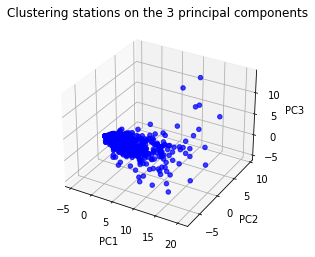

In [ ]:
pca_3d_clustering()

Neither of the scatter plots above show us some clear patterns in the data

Source: https://www.python-graph-gallery.com/372-3d-pca-result

**Result**: Given the shape of the station clusters (both2d and 3d), we can draw the conclusion that based on the 24 hour intervals,
we can not plot the clusters on the principal components, as we can not see any clear signs of similarity between the points.

# Conclusions

The importance of this work resides in the required knowledge for future investments in the bicycle system of the city. For example, an adequate understanding of the demand and system capacity will shift the behavior of the users towards a more sustainable way of commuting (analysis of proper size of stations in certain areas with a given level of demand). This information can be vital in order to expand the network. Another possible application is a deeper understanding of the type of users (age, gender, frequency of use...) in order to create campaigns of loyalty or establish discounts to certain groups of customers to offer a better experience.
Some proposed ideas are the following:
- Maintenance performance and bikes relocation during valley hours of use
- Dynamic pricing according to season for promotion
- High use of bikes for commuting purposes: Increase stations near workplaces
- Busiest routes should have higher priority for future bikepath aplications

Something to be remarked is the nature of the dataset, composed by more than 17 million observations, has represented an issue in terms of computing times. This complexity has been addressed using data sampling during most of the code development. Once our code had been validated, the whole dataset was applied.

Overall, the results have been satisfactory. The prediction challenge offers reliable results with the introduction of the weather and daylight data. Also, unsupervised techniques, such as PCA have allowed us to work with reduced amount of data without losing vital pieces of information.

Finally, we have extended the dataset, using weather and light, to fine tune our regression models, and obtain a better understanding of the customers' behavior. However, there are also improvements that we can bring to our work, including a more efficient choice of variables with regards to both clustering and PCA, in order to obtain be able to explore more the  data set.

# Contribution Table

In [ ]:
d = {'Data Exploration' : ['Yes', 'Yes', 'Yes', 'Yes'],
     'Prediction Challenge' : ['Yes', 'Yes', 'No', 'No'],
     'Exploratory - New Data for Prediction' : ['Yes', 'Yes', 'No', 'No'],
     'Exploratory - PCA + Station Clustering' : ['No', 'No', 'Yes', 'Yes'],
     'Conclusion' : ['Yes', 'Yes', 'Yes', 'Yes']
     }

ct = pd.DataFrame(d, index=['Carlos Ramos', 'Yufan Du', 'Danning Yang', 'Bogdan Capsa'])

ct

# Appendix

## Section 1: Introduction + Data analysis and visualization

### Imports packages

In [ ]:
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from folium.plugins import HeatMap
%matplotlib inline
import numpy as np
import seaborn as sns
import folium

#### tripduration(1.2.2.2)

In [ ]:
import seaborn as sns
def plottripsduation(trip):
    sns.set_theme()
    sns.displot(df['tripduration'], bins = 150)
    plt.show()

In [ ]:
def plottripduration(trip):
    fig, axes = plt.subplots(1, 2)

    sns.set_theme()
    sns.histplot(df[df['usertype_Subscriber'] == 1]['tripduration'], bins = 150, kde=True,  ax = axes[0])
    sns.histplot(df[df['usertype_Subscriber'] == 0]['tripduration'], bins = 150, kde=True,  ax = axes[1])

    axes[0].set_title("subcriber")
    axes[1].set_title("customer")

    plt.tight_layout()

#### age(1.2.2.3)

In [ ]:
def agesdistribution(age):

    sns.set_theme()
    sns.displot(df['age'], bins = 150)
    plt.ticklabel_format(style='plain', axis='y',useOffset=False)
    plt.show()

In [ ]:
def agedistribution(age):
    fig, axes = plt.subplots(1, 2)

    sns.set_theme()
    sns.histplot(df[df['usertype_Subscriber'] == 1]['age'], bins = 150, kde=True,  ax = axes[0])
    sns.histplot(df[df['usertype_Subscriber'] == 0]['age'], bins = 150, kde=True,  ax = axes[1])

    axes[0].set_title("subcriber")
    axes[1].set_title("customer")
    axes[1].ticklabel_format(style='plain', axis='both')

    plt.tight_layout()

#### based on month(1.2.3.1)

In [ ]:
def month(cus,sub):
    fig, (ax1, ax2) = plt.subplots(2)
    fig.suptitle('Variation of count with month')
    ax1.plot(sub, color = 'coral', linewidth = '2')
    ax2.plot(cus, color = 'coral', linewidth = '2')

    plt.xlabel("Month")
    ax1.set_ylabel("Subcribers")
    ax2.set_ylabel("Customers")
    ax1.ticklabel_format(style='plain')

    ax1.set_xticks(range(1,13))
    ax1.set_xticklabels(range(1,13))
    ax2.set_xticks(range(1,13))
    ax2.set_xticklabels(range(1,13))

    plt.show()

#### based on weekly(1.2.3.2)

In [ ]:
sub_spring = df[(df['usertype_Subscriber']==1)&(df['start_month']>=3)&(df['start_month']<=5)].groupby('weekday').size()
sub_summer = df[(df['usertype_Subscriber']==1)&(df['start_month']>=6)&(df['start_month']<=8)].groupby('weekday').size()
sub_autumn = df[(df['usertype_Subscriber']==1)&(df['start_month']>=9)&(df['start_month']<=11)].groupby('weekday').size()
sub_winter = df[(df['usertype_Subscriber']==1)&((df['start_month']==1)|(df['start_month']==2)|(df['start_month']==12))].groupby('weekday').size()

cus_spring = df[(df['usertype_Subscriber']==0)&(df['start_month']>=3)&(df['start_month']<=5)].groupby('weekday').size()
cus_summer = df[(df['usertype_Subscriber']==0)&(df['start_month']>=6)&(df['start_month']<=8)].groupby('weekday').size()
cus_autumn = df[(df['usertype_Subscriber']==0)&(df['start_month']>=9)&(df['start_month']<=11)].groupby('weekday').size()
cus_winter = df[(df['usertype_Subscriber']==0)&((df['start_month']==1)|(df['start_month']==2)|(df['start_month']==12))].groupby('weekday').size()

def weekly(sspr,ssum,saut,swin,cspr,csum,caut,cwin):

    fig, (ax1, ax2) = plt.subplots(2)
    fig.suptitle('Variation of weekly ridership based on season')

    ax1.plot(sub_spring, color = 'c', linewidth = '2', linestyle='--')
    ax1.plot(sub_summer, color = 'b', linewidth = '2', linestyle='--')
    ax1.plot(sub_autumn, color = 'g', linewidth = '2', linestyle='--')
    ax1.plot(sub_winter, color = 'r', linewidth = '2', linestyle='--')
    ax2.plot(cus_spring, color = 'c', linewidth = '2', linestyle='--', label = 'spring')
    ax2.plot(cus_summer, color = 'b', linewidth = '2', linestyle='--', label = 'summer')
    ax2.plot(cus_autumn, color = 'g', linewidth = '2', linestyle='--', label = 'autumn')
    ax2.plot(cus_winter, color = 'r', linewidth = '2', linestyle='--', label = 'winter')

    plt.xlabel("Weekday")
    ax1.set_ylabel("Subcribers")
    ax2.set_ylabel("Customers")
    ax1.ticklabel_format(style='plain')

    ax1.set_xticks(range(7))
    ax1.set_xticklabels(['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])
    ax2.set_xticks(range(7))
    ax2.set_xticklabels(['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])
    # plt.figlegend( loc = 'lower center', borderaxespad=0.1, ncol=6, labelspacing=0.,  prop={'size': 13} ) #bbox_to_anchor=(0.5, 0.0), borderaxespad=0.1,
    plt.legend(bbox_to_anchor=(1, -0.26),ncol=4)
    plt.show()

#### based on day(1.2.3.3)

In [ ]:
sub_spring = df[(df['usertype_Subscriber']==1)&(df['start_month']>=3)&(df['start_month']<=5)].groupby('hour').size()
sub_summer = df[(df['usertype_Subscriber']==1)&(df['start_month']>=6)&(df['start_month']<=8)].groupby('hour').size()
sub_autumn = df[(df['usertype_Subscriber']==1)&(df['start_month']>=9)&(df['start_month']<=11)].groupby('hour').size()
sub_winter = df[(df['usertype_Subscriber']==1)&((df['start_month']==1)|(df['start_month']==2)|(df['start_month']==12))].groupby('hour').size()

cus_spring = df[(df['usertype_Subscriber']==0)&(df['start_month']>=3)&(df['start_month']<=5)].groupby('hour').size()
cus_summer = df[(df['usertype_Subscriber']==0)&(df['start_month']>=6)&(df['start_month']<=8)].groupby('hour').size()
cus_autumn = df[(df['usertype_Subscriber']==0)&(df['start_month']>=9)&(df['start_month']<=11)].groupby('hour').size()
cus_winter = df[(df['usertype_Subscriber']==0)&((df['start_month']==1)|(df['start_month']==2)|(df['start_month']==12))].groupby('hour').size()

def day(sspr,ssum,saut,swin,cspr,csum,caut,cwin):

    fig, (ax1, ax2) = plt.subplots(2)
    fig.suptitle('Variation of hourly ridership based on season')

    ax1.plot(sub_spring, color = 'c', linewidth = '2', linestyle='--')
    ax1.plot(sub_summer, color = 'b', linewidth = '2', linestyle='--')
    ax1.plot(sub_autumn, color = 'g', linewidth = '2', linestyle='--')
    ax1.plot(sub_winter, color = 'r', linewidth = '2', linestyle='--')
    ax2.plot(cus_spring, color = 'c', linewidth = '2', linestyle='--', label = 'spring')
    ax2.plot(cus_summer, color = 'b', linewidth = '2', linestyle='--', label = 'summer')
    ax2.plot(cus_autumn, color = 'g', linewidth = '2', linestyle='--', label = 'autumn')
    ax2.plot(cus_winter, color = 'r', linewidth = '2', linestyle='--', label = 'winter')

    plt.xlabel("Hour")
    ax1.set_ylabel("Subcribers")
    ax2.set_ylabel("Customers")
    ax1.ticklabel_format(style='plain')

    ax1.set_xticks(range(0,24))
    ax1.set_xticklabels(range(1,25))
    ax2.set_xticks(range(0,24))
    ax2.set_xticklabels(range(1,25))
    # plt.figlegend( loc = 'lower center', borderaxespad=0.1, ncol=6, labelspacing=0.,  prop={'size': 13} ) #bbox_to_anchor=(0.5, 0.0), borderaxespad=0.1,
    plt.legend(bbox_to_anchor=(1, -0.26),ncol=4)
    plt.show()

#### based on dayly pickups(1.2.3.5)

In [ ]:
def pickups(pickups):
    import matplotlib as mpl
    monthly_pickups = df.groupby('start_month').count()
    daily_pickups = df.groupby('date').count()
    fig , ax = plt.subplots(figsize=(16, 6))
    daily_pickups['bikeid'].plot(ax=ax)

    style = dict(size=10, color='gray')

    #Labeling axes
    ax.set(title='dayly pickups', ylabel='Num of pickups')

    #Format the x axis with centered month labels( Credit to Data Science Handbook)
    ax.xaxis.set_major_locator(mpl.dates.MonthLocator())
    ax.xaxis.set_major_locator(mpl.dates.MonthLocator(bymonthday=15))


    ax.annotate("New Year's Day", xy=('2018-1-1', 5050), xycoords= 'data',
                xytext=(-30, 0), textcoords='offset points', \
                size=13, ha='right', va='center', \
                bbox=dict(boxstyle="round", alpha=0.1), \
                arrowprops=dict(arrowstyle="wedge, tail_width=0.5", alpha=0.1));

    ax.annotate("Blizzard", xy=('2018-1-4', 1992), xycoords= 'data',
                xytext=(40, -10), textcoords='offset points', \
                arrowprops=dict(arrowstyle="->", color='black', connectionstyle="arc3, rad=-0.2"));

#### based on velocity(1.2.3.6)

In [ ]:
from math import sin, cos, sqrt, atan2, radians
from haversine import haversine, Unit

def distance(lat1, lat2, lon1, lon2):
    R=6373
    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat / 2)**2 + np.cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance

In [ ]:
def haversine_vectorized(df):
    lat1 = df['start_station_latitude']
    lon1 = df['start_station_longitude']
    lat2 = df['end_station_latitude']
    lon2 = df['end_station_longitude']
    return haversine(lat1, lon1, lat2, lon2)

def haversine(lat1, lon1, lat2, lon2):
    miles_constant = 3959
    lat1, lon1, lat2, lon2 = map(np.deg2rad, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    mi = miles_constant * c
    return mi

In [ ]:
def plotvelocityusertype():
    fig, axes = plt.subplots(1, 2)

    sns.set_theme()
    sns.histplot(velsub, bins = 150, kde=True,  ax = axes[0])

    sns.histplot(velcus, bins = 150, kde=True,  ax = axes[1])

    axes[0].set_title("subcriber")
    axes[1].set_title("customer")

    plt.tight_layout()

In [ ]:
def plotvelocitygender():
    data_boxplot = [df_vel[df_vel['gender']==x]['Avg velocity'] for x in range(0,3)]
    plt.boxplot(data_boxplot)
    plt.show()

## Section 2: Prediction Challenge

### Imports packages and dataclean

In [ ]:
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import numpy as np
import datetime
import seaborn as sns
pd.options.mode.chained_assignment = None  # default='warn'

In [ ]:
from sklearn import datasets, linear_model
from sklearn.linear_model import LogisticRegression,Ridge, Lasso
from sklearn.metrics import confusion_matrix, f1_score,accuracy_score,recall_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

In [ ]:
def PredictiveDataClean(df):
    df['starttime'] = pd.to_datetime(df['starttime'], infer_datetime_format=True)
    df['datetime']=df.starttime.dt.floor('H')
    data = pd.DataFrame(df.groupby('datetime').size())
    data['count'] = data[0]
    del data[0]
    data = data.reset_index()

    data['hour']=np.array([d.hour for d in data['datetime']])
    data['month']=np.array([d.month for d in data['datetime']])
    data['weekday']=np.array([d.weekday() for d in data['datetime']])
    data['day']=np.array([d.day for d in data['datetime']])

    data['weekly'] = data['weekday']
    for i in range(len(data)):
        if data['weekly'][i] >= 0 and data['weekly'][i] <= 4:
            data['weekly'][i] = 1
        else:
            data['weekly'][i] = 0

    data.head()
    return data

### Part 1

In [ ]:
def Predictive_Part1_data(data):
    data = pd.get_dummies(data, columns=['hour'],drop_first=True)
    features = ['weekly', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10',
           'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20',
           'hour_21', 'hour_22', 'hour_23']
    target = 'count'

    trainset_start = pd.to_datetime('2018-07-01 00:00:00')
    trainset_end = pd.to_datetime('2018-08-31 23:00:00')
    testset_start = pd.to_datetime('2018-09-01 01:00:00')
    testset_end = pd.to_datetime('2018-09-07 23:00:00')

    x_train1 = data.loc[((data['datetime'] <= trainset_end) & (data['datetime'] >= trainset_start)), features]
    y_train1 = data.loc[((data['datetime'] <= trainset_end) & (data['datetime'] >= trainset_start)), target]

    x_test1 = data.loc[((data['datetime'] >= testset_start) & (data['datetime'] <= testset_end)), features]
    y_test1 = data.loc[((data['datetime'] >= testset_start) & (data['datetime'] <= testset_end)), target]
    return x_train1, x_test1, y_train1, y_test1

In [ ]:
def Predictive_Part1(x_train, x_test, y_train, y_test):
    rfr = RandomForestRegressor()
    rfr.fit(x_train1, y_train1)
    y_pred1 = rfr.predict(x_test1)
    print("Random Forest Regressor")
    print("R-squared for Train: %.2f" % rfr.score(x_train1, y_train1))
    print("R-squared for Test: %.2f" % rfr.score(x_test1, y_test1))
    RMSE = np.sqrt(np.mean((y_test1** 2 - y_pred1 ** 2) ** 2))
    MSE = RMSE ** 2

    print("MSE ={}".format(MSE))
    print("RMSE = {}".format(RMSE))

    y_predict1 = list(y_pred1)
    y_testplot1 = list(y_test1)

    plt.figure(figsize=(20, 4))
    # plt.scatter(range(len(ygbr_pred2)), y_predict, s =20, c ='coral')
    plt.plot(range(len(y_pred1)), y_testplot1, linewidth = '2', c ='slategrey', label = 'y_test')
    plt.plot(range(len(y_pred1)), y_predict1, linewidth = '2', c ='bisque', label = 'y_predict')
    plt.legend()

    plt.show()###

In [ ]:
def Predictive_Part1_tuning(x_train, x_test, y_train, y_test):
    rfr = RandomForestRegressor(oob_score=True, n_estimators=200,max_samples=1400,max_depth=300,min_samples_split=2)
    rfr.fit(x_train1, y_train1)
    y_predtune1 = rfr.predict(x_test1)
    print("Random Forest Regressor")
    print("R-squared for Train: %.2f" % rfr.score(x_train1, y_train1))
    print("R-squared for Test: %.2f" % rfr.score(x_test1, y_test1))
    RMSE = np.sqrt(np.mean((y_test1** 2 - y_predtune1 ** 2) ** 2))
    MSE = RMSE ** 2

    print("MSE ={}".format(MSE))
    print("RMSE = {}".format(RMSE))

    y_predict = list(y_predtune1)
    y_testplot = list(y_test1)

    plt.figure(figsize=(20, 4))
    # plt.scatter(range(len(ygbr_pred2)), y_predict, s =20, c ='coral')
    plt.plot(range(len(y_predtune1)), y_testplot, linewidth = '2', c ='slategrey', label = 'y_test')
    plt.plot(range(len(y_predtune1)), y_predict, linewidth = '2', c ='bisque', label = 'y_predict')
    plt.legend()

    plt.show() ###

In [ ]:
def Other_Part1_Predictions(x_train, x_test, y_train, y_test):
    ridge = Ridge()
    ridge.fit(x_train1, y_train1)
    y_predo1 = ridge.predict(x_test1)
    print("Ridge")
    print("R-squared for Train: %.2f" % ridge.score(x_train1, y_train1))
    print("R-squared for Test: %.2f" % ridge.score(x_test1, y_test1))

    RMSE = np.sqrt(np.mean((y_test1** 2 - y_predo1 ** 2) ** 2))
    MSE = RMSE ** 2

    print("MSE ={}".format(MSE))
    print("RMSE = {}".format(RMSE))

    lasso = Lasso()
    lasso.fit(x_train1, y_train1)
    y_predo2 = lasso.predict(x_test1)

    print("Lasso")
    print("R-squared for Train: %.2f" % lasso.score(x_train1, y_train1))
    print("R-squared for Test: %.2f" % lasso.score(x_test1, y_test1))


    RMSE = np.sqrt(np.mean((y_test1** 2 - y_predo2 ** 2) ** 2))
    MSE = RMSE ** 2

    print("MSE ={}".format(MSE))
    print("RMSE = {}".format(RMSE))

    dtc = DecisionTreeClassifier()
    dtc.fit(x_train1, y_train1)
    y_predo3 = dtc.predict(x_test1)
    print("Decision Tree Classifier")
    print("R-squared for Train: %.2f" % dtc.score(x_train1, y_train1))
    print("R-squared for Test: %.2f" % dtc.score(x_test1, y_test1))

    RMSE = np.sqrt(np.mean((y_test1** 2 - y_predo3 ** 2) ** 2))
    MSE = RMSE ** 2

    print("MSE ={}".format(MSE))
    print("RMSE = {}".format(RMSE))

    from sklearn.ensemble import GradientBoostingRegressor
    gbr = GradientBoostingRegressor()
    gbr.fit(x_train1, y_train1)
    y_predo4 = gbr.predict(x_test1)
    print("Gradient Boost Regressor")
    print("R-squared for Train: %.2f" % gbr.score(x_train1, y_train1))
    print("R-squared for Test: %.2f" % gbr.score(x_test1, y_test1))

    print("MSE ={}".format(MSE))
    print("RMSE = {}".format(RMSE)) ###

### Part 2

In [ ]:
def Predictive_Part2_data(data):
    data = pd.get_dummies(data, columns=['hour','month'],drop_first=True)
    features = ['weekly', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10',
           'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20',
           'hour_21', 'hour_22', 'hour_23', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10',
           'month_11', 'month_12']
    target = 'count'

    trainset_start = pd.to_datetime('2018-01-01 00:00:00')
    trainset_end = pd.to_datetime('2018-10-31 23:00:00')
    testset_start = pd.to_datetime('2018-11-01 00:00:00')
    testset_end = pd.to_datetime('2018-12-31 23:00:00')

    x_train2 = data.loc[((data['datetime'] <= trainset_end) & (data['datetime'] >= trainset_start)), features]
    y_train2 = data.loc[((data['datetime'] <= trainset_end) & (data['datetime'] >= trainset_start)), target]

    x_test2 = data.loc[((data['datetime'] >= testset_start) & (data['datetime'] <= testset_end)), features]
    y_test2 = data.loc[((data['datetime'] >= testset_start) & (data['datetime'] <= testset_end)), target]
    return x_train2, x_test2, y_train2, y_test2 ###

In [ ]:
def Predictive_Part2(x_train, x_test, y_train, y_test):
    from sklearn.ensemble import GradientBoostingRegressor
    gbr = GradientBoostingRegressor()
    gbr.fit(x_train2, y_train2)
    y_pred2 = gbr.predict(x_test2)

    print("R-squared for Train: %.2f" % gbr.score(x_train2, y_train2))
    print("R-squared for Test: %.2f" % gbr.score(x_test2, y_test2))

    RMSE = np.sqrt(np.mean((y_test2** 2 - y_pred2 ** 2) ** 2))
    MSE = RMSE ** 2

    print("MSE ={}".format(MSE))
    print("RMSE = {}".format(RMSE))

    y_predict = list(y_pred2)
    y_testplot = list(y_test2)

    plt.figure(figsize=(20, 4))
    # plt.scatter(range(len(ygbr_pred2)), y_predict, s =20, c ='coral')
    plt.plot(range(len(y_pred2)), y_testplot, linewidth = '2', c ='slategrey', label = 'y_test')
    plt.plot(range(len(y_pred2)), y_predict, linewidth = '2', c ='bisque', label = 'y_predict')
    plt.legend()

    plt.show()###

In [ ]:
def Predictive_Part2_tuning(x_train, x_test, y_train, y_test):
    from sklearn.ensemble import GradientBoostingRegressor
    gbr = GradientBoostingRegressor(n_estimators=180, learning_rate = 0.1, random_state=42,min_samples_split=250, max_depth=4)
    gbr.fit(x_train2, y_train2)
    y_predtune2 = gbr.predict(x_test2)

    print("R-squared for Train: %.2f" % gbr.score(x_train2, y_train2))
    print("R-squared for Test: %.2f" % gbr.score(x_test2, y_test2))

    RMSE = np.sqrt(np.mean((y_test2** 2 - y_predtune2 ** 2) ** 2))
    MSE = RMSE ** 2

    print("MSE ={}".format(MSE))
    print("RMSE = {}".format(RMSE))

    y_predict = list(y_predtune2)
    y_testplot = list(y_test2)

    plt.figure(figsize=(20, 4))
    # plt.scatter(range(len(ygbr_pred2)), y_predict, s =20, c ='coral')
    plt.plot(range(len(y_predtune2)), y_testplot, linewidth = '2', c ='slategrey', label = 'y_test')
    plt.plot(range(len(y_predtune2)), y_predict, linewidth = '2', c ='bisque', label = 'y_predict')
    plt.legend()

    plt.show()

## Section 3: Exploratory Challenge

### Aditional Research Question

Here we want o investigate how does light incluence the pickups demand. As expected, all months have higer demand during light day in comparison with darkness.

However, it is surprising, the fact that October, November and December have higher pickups during dark hours, in comparison to  all other months. We have to remember, that the working/active hours (08:00 - 20:00) also play an important role in the demand variation.

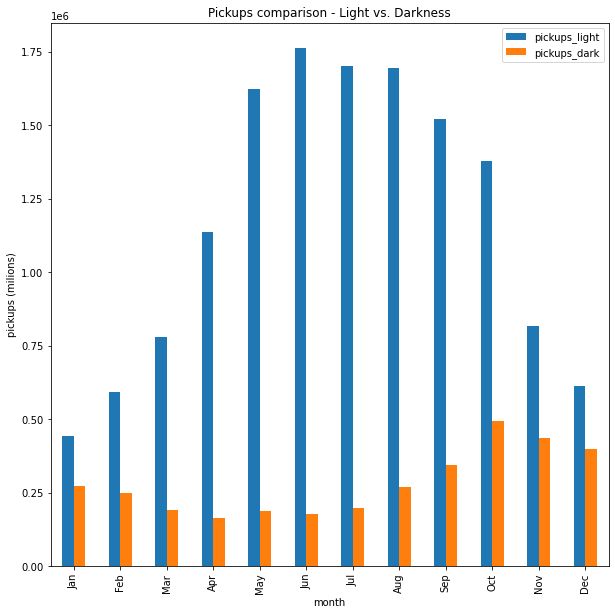

In [ ]:
plot_monthly_pickups_light()

### Obtaining new data (Weather and Light)

We'll extend the data from geo weather and we'll obtain the light from the python function

In [ ]:
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import numpy as np
from sklearn import datasets, linear_model
import calendar

#### Weather

In [ ]:
import tabula
nums = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']
pdf = '.pdf'
csv = '.csv'
pdf_list = [s + pdf for s in nums]
csv_list = [s + csv for s in nums]

for num in nums:
    tabula.convert_into(num + pdf, num + csv, output_format="csv", pages='all')

In [ ]:
import glob
import os

path = os.getcwd()
csv_files = glob.glob(os.path.join(path, "*.csv"))
dfs = []
for f in csv_files:
    # read the csv file
    df = pd.read_csv(f)
    df = df.iloc[3:]
    df.rename(columns={df.columns[0]: 'date',
                       df.columns[1]: 'Maximum',
                       df.columns[2]: 'Minimum Average Departure'},
          inplace=True, errors='raise')
    df = df[df.date != 'Max Temperature : midnight']
    df = df[df.date != 'Min Temperature : midnight']
    df = df[df.date != 'Precipitation : midnight']
    df = df[df.date != 'Snowfall : unknown']
    df = df[df.date != 'Snow Depth : midnight']
    df = df[df.date != 'at the time given below (Local Standard Time).']
    df = df[df.date != 'Observations for each day cover the 24 hours ending']
    dfs.append(df)

In [ ]:
def del_cols(df):
    df = df[df.date != 'Sum']
    df = df[df.date != 'Average']
    df = df[df.date != 'Normal']
    return df


def convert_min_avg_dep(df):
    df[['min', 'avg', 'departure', 'hdd', 'cdd', 'precipitation', 'snow']] = df['Minimum Average Departure'].str.split(' ', expand=True)
    df.drop(['Minimum Average Departure', 'Unnamed: 3'], axis = 1, inplace = True)
    df.rename(columns={'Maximum': 'max'}, inplace=True, errors='raise')
    df = del_cols(df)
    return df


def convert_max(df):
    df_copy = df.copy(deep = True)
    df_copy = df_copy['Maximum'].str.split(' ', expand=True)
    df_copy.rename(columns = {0: 'max', 1: 'min', 2: 'avg', 3: 'departure',
                              4: 'hdd', 5: 'cdd', 6: 'precipitation',
                              7: 'snow'}, inplace=True, errors='raise')
    df =pd.concat((df, df_copy), axis=1)
    df = del_cols(df)
    df.drop(['Minimum Average Departure', 'Maximum'], axis = 1, inplace = True)
    return df


min_avg_dep_range = [0, 2, 3, 4, 5, 6, 7, 9]
for val in min_avg_dep_range:
    dfs[val] = convert_min_avg_dep(dfs[val])

range_max = [1, 8, 10, 11]
for val in range_max:
    dfs[val] = convert_max(dfs[val])

In [ ]:
df.to_pickle("./weather-2018.pkl")

#### Light

In [ ]:
import datetime
import pandas as pd
import pytz

try:
    from suntime import Sun, SunTimeException
except ModuleNotFoundError:
    !pip install suntime

latitude = 40.7128
longitude = -74.0060

sun = Sun(latitude, longitude)

# Get today's sunrise and sunset in UTC
today_sr = sun.get_sunrise_time()
today_ss = sun.get_sunset_time()
print('Today at New York the sun raised at {} and got down at {} UTC'.
      format(today_sr.strftime('%H:%M'), today_ss.strftime('%H:%M')))


df_weather = pd.read_pickle('weather-2018.pkl')
df_weather['date'] = pd.to_datetime(df_weather['date'])
df_weather['date'] = df_weather['date'].dt.date

sunrises = []
sunsets = []
dates = df_weather['date'].to_list()
for date in dates:
    date_sunrise = sun.get_local_sunrise_time(date)
    date_sunset = sun.get_local_sunset_time(date)
    sunrises.append(date_sunrise.strftime('%H:%M'))
    sunsets.append(date_sunset.strftime('%H:%M'))
    dates.append


data_sunlight = {'date': dates, 'sunrise': sunrises, 'sunset': sunsets}
df_light = pd.DataFrame(data = data_sunlight)

df_light['sunrise'] = pd.to_datetime(df_light['sunrise'], infer_datetime_format=True)
df_light['sunset'] = pd.to_datetime(df_light['sunset'], infer_datetime_format=True)
eastern = pytz.timezone('US/Eastern')

df_light['sunrise'] = df_light['sunrise'].dt.tz_localize(pytz.utc).dt.tz_convert(eastern).dt.time
df_light['sunset'] = df_light['sunset'].dt.tz_localize(pytz.utc).dt.tz_convert(eastern).dt.time

df_light.to_pickle("./light_2018.pkl")

### Weather data extension

In [ ]:
data_weather = pd.read_pickle('weather_2018.pkl')
data_light = pd.read_pickle('light_2018.pkl')

In [ ]:
def removeT_prec(row):
    a=[]
    if row['precipitation']=="T":
        a=0
    else:
        a=row['precipitation']
    return a

def removeT_snow(row):
    a=[]
    if row['snow']=="T":
        a=0
    else:
        a=row['snow']
    return a

In [ ]:
def NewDataClean(data_weather,data_light,data_new):
    data_weather['precipitation']=data_weather.apply(removeT_prec, axis=1)
    data_weather['snow']=data_weather.apply(removeT_snow, axis=1)
    data_weather["avg"] = data_weather.avg.astype(float)
    data_weather["precipitation"] = data_weather.precipitation.astype(float)
    data_weather["snow"] = data_weather.snow.astype(float)

    data_weather = data_weather.drop(columns=['max','min','departure','hdd','cdd'])
    data_weather = data_weather.reset_index()
    del data_weather['index']


    data_weather['date'] = pd.to_datetime(data_weather['date'],  format="%Y-%m-%d")
    data_light['date'] = pd.to_datetime(data_light['date'],  format="%Y-%m-%d")

    data_mer = data_weather.merge(data_light,  on = 'date', how = 'inner')

    data_new['date'] = np.array([d.date() for d in data_new.datetime ])
    data_new['date'] = pd.to_datetime(data_new['date'],  format="%Y-%m-%d")

    data_new = data_new.merge(data_mer, on = 'date', how = 'inner')

    data_new['time'] = np.array([d.time() for d in data_new.datetime ])
    data_new['light'] = 0
    for i in range(len(data_new)):
        if data_new['time'][i].hour >= data_new['sunrise'][i].hour and data_new['time'][i].hour <= data_new['sunset'][i].hour:
            data_new['light'][i] = 1
        else:
            data_new['light'][i] = 0

    data_new = data_new.drop(columns=['date','time'])

    return data_new ###

In [ ]:
def Predictive_ext_Part1_data(data):
    data_new = pd.get_dummies(data_ext, columns=['hour'],drop_first=True)
    features = ['weekly', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10',
           'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20',
           'hour_21', 'hour_22', 'hour_23', 'month', "avg", "precipitation","snow","light"]
    target = 'count'

    trainset_start = pd.to_datetime('2018-07-01 00:00:00')
    trainset_end = pd.to_datetime('2018-08-31 23:00:00')
    testset_start = pd.to_datetime('2018-09-01 01:00:00')
    testset_end = pd.to_datetime('2018-09-07 23:00:00')

    x_train3 = data_new.loc[((data_new['datetime'] <= trainset_end) & (data_new['datetime'] >= trainset_start)), features]
    y_train3 = data_new.loc[((data_new['datetime'] <= trainset_end) & (data_new['datetime'] >= trainset_start)), target]

    x_test3 = data_new.loc[((data_new['datetime'] >= testset_start) & (data_new['datetime'] <= testset_end)), features]
    y_test3 = data_new.loc[((data_new['datetime'] >= testset_start) & (data_new['datetime'] <= testset_end)), target]

    x_train_std1 = x_train3.copy()
    x_test_std1 = x_test3.copy()

    x_train_std1['avg'] = (x_train3['avg'] - x_train3['avg'].mean()) / x_train3['avg'].std()
    x_test_std1['avg'] = (x_test3['avg'] - x_train3['avg'].mean()) / x_train3['avg'].std()
    x_train_std1['precipitation'] = (x_train3['precipitation'] - x_train3['precipitation'].mean()) / x_train3['precipitation'].std()
    x_test_std1['precipitation'] = (x_test3['precipitation'] - x_train3['precipitation'].mean()) / x_train3['precipitation'].std()
    return x_train_std1, x_test_std1, y_train3, y_test3 ###

In [ ]:
def Predictive_ext_Part2_data(data):
    data_new = pd.get_dummies(data_ext, columns=['hour','month'],drop_first=True)
    features = ['weekly', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10',
           'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20',
           'hour_21', 'hour_22', 'hour_23', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10',
           'month_11', 'month_12', "avg", "precipitation","snow","light"]
    target = 'count'

    trainset_start = pd.to_datetime('2018-01-01 00:00:00')
    trainset_end = pd.to_datetime('2018-10-31 23:00:00')
    testset_start = pd.to_datetime('2018-11-01 00:00:00')
    testset_end = pd.to_datetime('2018-12-31 23:00:00')

    x_train4 = data_new.loc[((data_new['datetime'] <= trainset_end) & (data_new['datetime'] >= trainset_start)), features]
    y_train4 = data_new.loc[((data_new['datetime'] <= trainset_end) & (data_new['datetime'] >= trainset_start)), target]

    x_test4 = data_new.loc[((data_new['datetime'] >= testset_start) & (data_new['datetime'] <= testset_end)), features]
    y_test4 = data_new.loc[((data_new['datetime'] >= testset_start) & (data_new['datetime'] <= testset_end)), target]


    x_train_std2 = x_train4.copy()
    x_test_std2 = x_test4.copy()

    x_train_std2['avg'] = (x_train4['avg'] - x_train4['avg'].mean()) / x_train4['avg'].std()
    x_test_std2['avg'] = (x_test4['avg'] - x_train4['avg'].mean()) / x_train4['avg'].std()
    x_train_std2['precipitation'] = (x_train4['precipitation'] - x_train4['precipitation'].mean()) / x_train4['precipitation'].std()
    x_test_std2['precipitation'] = (x_test4['precipitation'] - x_train4['precipitation'].mean()) / x_train4['precipitation'].std()
    return x_train_std2, x_test_std2, y_train4, y_test4

In [ ]:
def Predictive_ext_Part1(x_train, x_test, y_train, y_test):
    rfr = RandomForestRegressor()
    rfr.fit(x_train3, y_train3)
    y_pred3 = rfr.predict(x_test3)
    print("Random Forest Regressor")
    print("R-squared for Train: %.2f" % rfr.score(x_train3, y_train3))
    print("R-squared for Test: %.2f" % rfr.score(x_test3, y_test3))
    RMSE = np.sqrt(np.mean((y_test3** 2 - y_pred3 ** 2) ** 2))
    MSE = RMSE ** 2

    print("MSE ={}".format(MSE))
    print("RMSE = {}".format(RMSE))

    y_predict = list(y_pred3)
    y_testplot = list(y_test3)

    plt.figure(figsize=(20, 4))
    # plt.scatter(range(len(ygbr_pred2)), y_predict, s =20, c ='coral')
    plt.plot(range(len(y_pred3)), y_testplot, linewidth = '2', c ='slategrey', label = 'y_test')
    plt.plot(range(len(y_pred3)), y_predict, linewidth = '2', c ='bisque', label = 'y_predict')
    plt.legend()

    plt.show()

In [ ]:
def Predictive_ext_Part1_tuning(x_train, x_test, y_train, y_test):
    rfr = RandomForestRegressor(oob_score=True, n_estimators=200,max_samples=1000,max_depth=100,min_samples_split=20)
    rfr.fit(x_train3, y_train3)
    y_predtune3 = rfr.predict(x_test3)
    print("Random Forest Regressor")
    print("R-squared for Train: %.2f" % rfr.score(x_train3, y_train3))
    print("R-squared for Test: %.2f" % rfr.score(x_test3, y_test3))
    RMSE = np.sqrt(np.mean((y_test3** 2 - y_predtune3 ** 2) ** 2))
    MSE = RMSE ** 2

    print("MSE ={}".format(MSE))
    print("RMSE = {}".format(RMSE))

    y_predict = list(y_predtune3)
    y_testplot = list(y_test3)

    plt.figure(figsize=(20, 4))
    # plt.scatter(range(len(ygbr_pred2)), y_predict, s =20, c ='coral')
    plt.plot(range(len(y_predtune3)), y_testplot, linewidth = '2', c ='slategrey', label = 'y_test')
    plt.plot(range(len(y_predtune3)), y_predict, linewidth = '2', c ='bisque', label = 'y_predict')
    plt.legend()

    plt.show()

In [ ]:
def Predictive_ext_Part2(x_train, x_test, y_train, y_test):
    from sklearn.ensemble import GradientBoostingRegressor
    gbr = GradientBoostingRegressor()
    gbr.fit(x_train4, y_train4)
    y_pred4 = gbr.predict(x_test4)

    print("R-squared for Train: %.2f" % gbr.score(x_train4, y_train4))
    print("R-squared for Test: %.2f" % gbr.score(x_test4, y_test4))

    RMSE = np.sqrt(np.mean((y_test4** 2 - y_pred4 ** 2) ** 2))
    MSE = RMSE ** 2

    print("MSE ={}".format(MSE))
    print("RMSE = {}".format(RMSE))

    y_predict = list(y_pred4)
    y_testplot = list(y_test4)

    plt.figure(figsize=(20, 4))
    # plt.scatter(range(len(ygbr_pred2)), y_predict, s =20, c ='coral')
    plt.plot(range(len(y_pred4)), y_testplot, linewidth = '2', c ='slategrey', label = 'y_test')
    plt.plot(range(len(y_pred4)), y_predict, linewidth = '2', c ='bisque', label = 'y_predict')
    plt.legend()

    plt.show()

In [ ]:
def Predictive_ext_Part2_tuning(x_train, x_test, y_train, y_test):
    from sklearn.ensemble import GradientBoostingRegressor
    gbr = GradientBoostingRegressor(n_estimators=250, learning_rate = 0.25, random_state=42, min_samples_split=250, max_depth=2)

    gbr.fit(x_train4, y_train4)
    y_predtune4 = gbr.predict(x_test4)

    print("R-squared for Train: %.2f" % gbr.score(x_train4, y_train4))
    print("R-squared for Test: %.2f" % gbr.score(x_test4, y_test4))

    RMSE = np.sqrt(np.mean((y_test4** 2 - y_predtune4 ** 2) ** 2))
    MSE = RMSE ** 2

    print("MSE ={}".format(MSE))
    print("RMSE = {}".format(RMSE))

    y_predict = list(y_predtune4)
    y_testplot = list(y_test4)

    plt.figure(figsize=(20, 4))
    # plt.scatter(range(len(ygbr_pred2)), y_predict, s =20, c ='coral')
    plt.plot(range(len(y_predtune4)), y_testplot, linewidth = '2', c ='slategrey', label = 'y_test')
    plt.plot(range(len(y_predtune4)), y_predict, linewidth = '2', c ='bisque', label = 'y_predict')
    plt.legend()

    plt.show()

In [ ]:
import calendar

def group_cols(df, grouping_cols, old_col, new_col):
#     grouping_cols = ['date', 'start_station_id']
    df_grouped = df.groupby(grouping_cols).count()
    drop_cols = list(set(df.columns) - set(grouping_cols))
    drop_cols.remove(old_col)
    df_grouped.rename(columns={old_col: new_col}, inplace=True)
    df_grouped.drop(drop_cols, axis=1, inplace=True)
    df_grouped.reset_index(drop=False, inplace=True)
    return df_grouped

df_bikes_light = df_bikes[['date','starttime', 'start_station_id']] \
                      .merge(df_light, left_on='date', right_on='date')
df_bikes_light['starttime'] = pd.to_datetime(df_bikes_light['starttime'], unit='s').dt.time

mask_light = (df_bikes_light['starttime'] >= df_bikes_light['sunrise']) & \
             (df_bikes_light['starttime'] <= df_bikes_light['sunset'])
df_bikes_light['is_light'] = mask_light

df_bikes_light['month']= pd.DatetimeIndex(df_bikes_light['date']).month

df_bikes_lightness = df_bikes_light[mask_light]
df_bikes_darkness = df_bikes_light[~mask_light]

def group_single_col(df, col_name):
    df_grouped = df.groupby([col_name]).count()
    df_grouped.reset_index(drop=False, inplace=True)
    return df_grouped


daily_light_pickups = group_single_col(df_bikes_light[mask_light], 'date')
daily_dark_pickups = group_single_col(df_bikes_light[~mask_light], 'date')

monthly_light_pickups = df_bikes_light[mask_light].groupby('month').count()['date'].to_frame().reset_index()
monthly_light_pickups = monthly_light_pickups.rename(columns={'date':'pickups'})
monthly_light_pickups['month'] = monthly_light_pickups['month'].apply(lambda x: calendar.month_abbr[int(x)])


monthly_dark_pickups = df_bikes_light[~mask_light].groupby('month').count()['date'].to_frame().reset_index()
monthly_dark_pickups = monthly_dark_pickups.rename(columns={'date':'pickups'})
monthly_dark_pickups['month'] = monthly_dark_pickups['month'].apply(lambda x: calendar.month_abbr[int(x)])




In [ ]:
def plot_monthly_pickups_light():
    ax = df_monthly_light_dark_pickups.plot.bar()
    ax.figure.set_size_inches(10,10)

    ax.set_ylabel('pickups (milions)')
    ax.set_title('Pickups comparison - Light vs. Darkness')

### Applying PCA and Clustering

#### PCA Library

In [ ]:
def plot_pca_variance(pca):
    plt.figure(figsize=(10, 5), dpi=80)
    cdf = np.cumsum(pca.explained_variance_ratio_)
    num_components = pca.n_components_
    plt.plot(cdf)
    plt.xlabel('number of components')
    plt.ylabel('cumulative explained variance')
    plt.title('Variance explained by the principal components')
    plt.grid()
    plt.xticks(np.arange(0, num_components), np.arange(0, num_components))
    plt.show();
    print("Explained variance ration \n", cdf)

In [ ]:
def plot_elbow_kmeans(df_reduced):
    sse = []
    for i in range(1, 21):
        kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
        kmeans_pca.fit(df_reduced)
        sse.append(kmeans_pca.inertia_)

    plt.figure(figsize = (10, 8))
    plt.style.use("fivethirtyeight")
    plt.plot(range(1,21), sse, marker='o', linestyle = '--')
    plt.xticks(range(1,21))
    plt.xlabel("Number of Clusters")
    plt.ylabel("SSE")
    plt.title('K-means with PCA Clustering')
    kl = KneeLocator(range(1, 21), sse, curve="convex", direction="decreasing")
    print("Optimal number of clusters: ".kl.elbow)

In [ ]:
def plot_clusters_by_components(df, component_x, component_y):
    x_axis = df_stations_pca_kmeans[component_x]
    y_axis = df_stations_pca_kmeans[component_y]
    plt.figure(figsize=(7,6))
    sns.scatterplot(x_axis, y_axis, hue =  df_stations_pca_kmeans['PCA Cluster'], palette = ['g' , 'r', 'c'])
    plt.title('Cluster by PCA Components - Stations')
    plt.show();

In [ ]:
def pca_3d_clustering():

    from mpl_toolkits.mplot3d import Axes3D

    # initialize figure and 3d projection for the PC3 data
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # assign x,y,z coordinates from PC1, PC2 & PC3
    xs = df_stations_reduced.T[0]
    ys = df_stations_reduced.T[1]
    zs = df_stations_reduced.T[2]



# initialize scatter plot and label axes
    ax.scatter(xs, ys, zs, alpha=0.75, c='blue')
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    plt.title('Clustering stations on the 3 principal components')
    plt.show()

In [ ]:
df_stations_pca_kmeans = pd.concat([df_stations.reset_index(),
                            pd.DataFrame(df_stations_reduced)], axis=1)

#### PCA Data Preprocessing

In [ ]:
import pandas as pd
df_bikes = pd.read_pickle('data_2018_clean.pkl')
df_weather = pd.read_pickle('weather_2018.pkl')
df_light = pd.read_pickle('light_2018.pkl')

In [ ]:
# Copy OK
grouping_cols = ['start_station_id', 'hour']
df_stations_hourly_pickups = df_bikes.groupby(grouping_cols).count()/365
drop_cols = list(set(df_bikes.columns) - set(grouping_cols))
drop_cols.remove('bikeid')
df_stations_hourly_pickups.rename(columns={'bikeid': 'pickups'}, inplace=True)
df_stations_hourly_pickups.drop(drop_cols, axis=1, inplace=True)
df_stations_hourly_pickups.reset_index(inplace=True)

hours = list(range(0, 24))
all_stations = df_stations_hourly_pickups.groupby('start_station_id')['start_station_id'].nunique().index.to_list()
df_stations_all_hours = pd.DataFrame(all_stations, columns=['start_station_id'])
df_stations_all_hours['hour'] = df_stations_all_hours.start_station_id.apply(lambda row: hours)
df_stations_all_hours = df_stations_all_hours.explode('hour')

# Joining the df_pickups_hour ~ df_stations_all_hours start_station_id
# OK
df_stations_hourly = df_stations_hourly_pickups \
                    .merge(df_stations_all_hours, on=['start_station_id', 'hour'], how='right').reset_index()
del df_stations_hourly['index']
df_stations_hourly.pickups.fillna(0, inplace=True)
df_stations_hourly

df_result = df_stations_hourly.groupby(['start_station_id'])['pickups'].apply(list)
df_result = df_result.to_frame()
df_result = df_result.reset_index(level=0)
df_stations = pd.DataFrame(df_result.pickups.tolist(), index=df_result.start_station_id)

    # Renaming columns
for c in df_stations:
    if int(c) < 10:
        interval = "0{hour}:00-0{hour}:59".format(hour = c)
    else:
        interval = "{hour}:00--{hour}:59".format(hour = c)
    df_stations.rename(columns={c: interval}, inplace=True)
df_stations

,00:00-00:59,01:00-01:59,02:00-02:59,03:00-03:59,04:00-04:59,05:00-05:59,06:00-06:59,07:00-07:59,08:00-08:59,09:00-09:59,...,14:00--14:59,15:00--15:59,16:00--16:59,17:00--17:59,18:00--18:59,19:00--19:59,20:00--20:59,21:00--21:59,22:00--22:59,23:00--23:59
start_station_id,,,,,,,,,,,,,,,,,,,,,
72.0,0.912329,0.657534,0.449315,0.230137,0.315068,0.747945,1.397260,4.693151,9.254795,8.093151,...,5.849315,6.213699,7.531507,9.441096,9.558904,7.054795,4.189041,2.495890,2.172603,1.539726
79.0,0.627397,0.323288,0.158904,0.082192,0.049315,0.331507,0.745205,1.328767,4.202740,3.808219,...,4.619178,4.641096,5.676712,7.915068,9.676712,6.139726,3.389041,2.282192,1.375342,1.038356
82.0,0.172603,0.109589,0.071233,0.030137,0.024658,0.101370,1.120548,1.060274,1.487671,2.252055,...,1.736986,1.813699,1.964384,2.361644,2.386301,1.917808,1.342466,0.849315,0.490411,0.315068
83.0,0.419178,0.246575,0.101370,0.065753,0.035616,0.049315,0.758904,0.928767,1.049315,1.013699,...,2.153425,2.265753,2.454795,3.189041,3.879452,3.219178,2.320548,1.923288,1.575342,1.172603
119.0,0.021918,0.041096,0.027397,0.013699,0.041096,0.090411,0.465753,0.460274,0.854795,0.684932,...,0.613699,0.504110,0.605479,0.665753,0.531507,0.528767,0.326027,0.183562,0.142466,0.071233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3716.0,0.002740,0.008219,0.002740,0.000000,0.000000,0.002740,0.000000,0.019178,0.005479,0.038356,...,0.013699,0.035616,0.021918,0.005479,0.024658,0.010959,0.008219,0.005479,0.008219,0.000000
3718.0,0.032877,0.035616,0.021918,0.013699,0.016438,0.041096,0.205479,0.295890,0.947945,0.608219,...,0.323288,0.347945,0.287671,0.290411,0.268493,0.230137,0.175342,0.104110,0.142466,0.101370
3719.0,0.002740,0.005479,0.002740,0.000000,0.000000,0.000000,0.002740,0.002740,0.016438,0.027397,...,0.054795,0.046575,0.038356,0.054795,0.041096,0.038356,0.030137,0.032877,0.041096,0.010959


#### KMeans Library

In [ ]:
from sklearn.cluster import KMeans
kmeans_pca_stations = KMeans(n_clusters = 3, init ='k-means++', random_state = 42)
kmeans_pca_stations.fit(df_stations_reduced)

df_stations_pca_kmeans = pd.concat([df_stations.reset_index(),
                            pd.DataFrame(df_stations_reduced)], axis=1)

component_names = ['Component 1', 'Component 2', 'Component 3']
df_stations_pca_kmeans.columns.values[-3: ] = component_names
df_stations_pca_kmeans['PCA Cluster'] = kmeans_pca_stations.labels_
df_stations_pca_kmeans.head()

,start_station_id,00:00-00:59,01:00-01:59,02:00-02:59,03:00-03:59,04:00-04:59,05:00-05:59,06:00-06:59,07:00-07:59,08:00-08:59,...,18:00--18:59,19:00--19:59,20:00--20:59,21:00--21:59,22:00--22:59,23:00--23:59,Component 1,Component 2,Component 3,PCA Cluster
0,72.0,0.912329,0.657534,0.449315,0.230137,0.315068,0.747945,1.397260,4.693151,9.254795,...,9.558904,7.054795,4.189041,2.495890,2.172603,1.539726,3.904104,0.416550,-0.132512,2
1,79.0,0.627397,0.323288,0.158904,0.082192,0.049315,0.331507,0.745205,1.328767,4.202740,...,9.676712,6.139726,3.389041,2.282192,1.375342,1.038356,0.858575,-0.782811,-0.657274,2
2,82.0,0.172603,0.109589,0.071233,0.030137,0.024658,0.101370,1.120548,1.060274,1.487671,...,2.386301,1.917808,1.342466,0.849315,0.490411,0.315068,-2.455164,-0.187521,0.056385,0
3,83.0,0.419178,0.246575,0.101370,0.065753,0.035616,0.049315,0.758904,0.928767,1.049315,...,3.879452,3.219178,2.320548,1.923288,1.575342,1.172603,-1.465272,0.353262,-0.796547,0
4,119.0,0.021918,0.041096,0.027397,0.013699,0.041096,0.090411,0.465753,0.460274,0.854795,...,0.531507,0.528767,0.326027,0.183562,0.142466,0.071233,-3.837320,0.103990,0.150235,0


#### DBSCAN Library

In [ ]:
from sklearn.cluster import DBSCAN
import random
from matplotlib import colors as mcolors
dbs=DBSCAN(min_samples=40, eps=1)

def do_dbscan():
    dbs_stations = dbs.fit(df_stations_reduced)
    colors=list(mcolors.CSS4_COLORS.keys())

    num_colors=len(set(dbs.labels_))-1
    cluster_colors = random.choices(colors, k=num_colors)

    x_=[]
    y_=[]
    c_=[]
    num_colors=len(set(dbs.labels_))-1
    for label, x, y  in zip(dbs.labels_, df_stations_reduced[:,0], df_stations_reduced[:,1]):
        if label==-1:
            continue

        x_.append(x)
        y_.append(y)
        c_.append(cluster_colors[label])

    plt.figure(figsize=(18, 12))
    plt.xlabe
    plt.scatter(x_,y_,s=4,c=c_)